In [1]:
# reading in mat files 
import os, glob
import h5py 

# handling data
import pandas as pd
import numpy as np

# smoothing 
from scipy.signal import savgol_filter

# plotting 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.collections as clt
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from matplotlib.cm import ScalarMappable as mapp
import ptitprince as pt

%matplotlib inline

In [2]:
# Main location of the ADAM toolboox results 
PATH = '/Users/Serena/Desktop/CRPS_decoding_paper/EEG Data/Results/'

In [3]:
# Open mat files and extract classifier output (i.e. diagonal or TGM
def read_output(file, filt = (9,5), output_type = 'diag'):
    with h5py.File(PATH + file, 'r') as f:
        if output_type == 'tgm':
            pattern = pd.DataFrame(list(f['BDM']['ClassOverTime']))
        else:
            class_over_time = pd.DataFrame(list(f['BDM']['ClassOverTime']))
            # estract diagonal values
            pattern = np.array(np.diag(class_over_time))
            # smooth the timeseries
            pattern = savgol_filter(pattern, filt[0], filt[1]) # window size 9, polynomial order 5
    return(pattern)

def build_dataframes(newpaths, dfnames, n_subjs = 13, filtr = (9,5)):
    # this function takes a list of paths and df names and uses read_output to 
    # extract decoding performance data, store it in a dataframe with time as index
    # and subjects as colums, and stores it using dfnames as variable names
    for i in range(len(newpaths)):
        globals()[dfnames[i]] = pd.DataFrame(np.nan, index=time, columns=range(n_subjs))
        
        os.chdir(PATH + newpaths[i])
        
        for n, file in enumerate(glob.glob("*.mat")):
            x = read_output(newpaths[i] + file, filt = filtr)
            x = pd.DataFrame(x, index = time)
            globals()[dfnames[i]].iloc[:,n] = x

        # add a mean and SD column (that will be plotted later)
        globals()[dfnames[i]]['m'] = globals()[dfnames[i]].mean(numeric_only = True, axis=1)
        globals()[dfnames[i]]['s'] = globals()[dfnames[i]].std(numeric_only = True, axis=1)/4
        globals()[dfnames[i]]['sign'] = np.nan

def stack_sides(side1, side2, name):
    # Make group dataframes by merging the two sides and creating 
    # group-condition mean and SD column
    newdf = pd.concat([side1.drop(columns=['m','s','sign']), 
                       side2.drop(columns=['m','s'])], axis = 1)
    newdf['m'] = newdf.mean(numeric_only = True, axis = 1);
    newdf['s'] = newdf.std(numeric_only = True, axis=1)/4
    globals()[name] = newdf

def read_pstruct(folders = []):
    # takes a list of folder names and returns a dictionary with significant clusters
    # initiate empty cluster
    cluster = {}
    
    for folder in folders:
        with open(PATH + folder + "/pstructs.txt", "r") as f:
            lines = f.read().splitlines()

        for n, line in enumerate(lines):
            if line == "POSCLUSTERS":
                cond = lines[n-2]
                cluster[cond] = []
            if line.split('\t')[0] == 'start_time:':
                cluster[cond].append(int(line.split('\t')[1]))
            if line.split('\t')[0] == 'stop_time:':
                cluster[cond].append(int(line.split('\t')[1]))
    return cluster

# Plotting tools now 
def cleveland(value, ax, group, color, side = 0, other = 1, adj = 0):
    # Center title
    title = "\nSentitivity (d-prime)" if value == "d" else "\nBias (c)"
    ax.set_title(title, fontsize = 14)
    
    # grey shadowing 
    ax.hlines(y = group.index, xmin = group.iloc[:,side]-adj, xmax = group.iloc[:,other], 
               color = 'grey', lw = 7, alpha = 0.3)
    # sides
    ax.scatter(group.iloc[:,side]-adj, group.index, color = color[0], marker = "|", s = 50, label='aff',
                linewidths = 4, alpha = 1)
    ax.scatter(group.iloc[:,other], group.index, color = color[1], marker = "|", s = 50, label='unaff', 
                linewidths = 4, alpha = 1)
    if value == "d":
        ax.set_xlim(-0.5,4.5); ax.set_xticks([0,1,2,3,4]); ax.set_xlabel('d-score\n\n', fontsize = 10)
    else: 
        ax.set_xlim(-1.5,1.5); ax.set_xticks([-1,-0.5,0,0.5,1]); ax.set_xlabel('c-score\n\n', fontsize = 10)

# fuction that plots the decoder timeseries in ADAM's fashion (used in Fig4)
def mvpaplot(ax, df, cond, lab, c, a = 1, w = 0.8, W = 3.2, title = '\n', low_rug = True, red = 1): 
    # arguments: ax = axes (subplot) where to draw the line; 
    # df = dataframe containing the mean (column 'm') decoding of the condition
    # cond = key in the cluster dictionary obtained from reading the pstruct
    # lab = label for the legend, c = color, a = transparency, w = width of the thinner line
    # W = width of the significant portion, red = reduction for example to compare AUC and accuracy
    ax.set_title(title, fontweight = 'bold')
    # plot the timeseries
    ax.plot(time, df['m']/red, alpha = a, lw = w, color = c)
    # plot the std curves
    ax.fill_between(time, df['m']/red-df['s']/red, df['m']/red+df['s']/red, color = c, alpha = 0.1) 
    # plot significant portions of timeseries in "bold"
    ax.plot(time, df['sign']/red, color = c, lw = W, label = lab)
    # plot the lower rugs, corresponidng to significant windows
    lvl = 0 if low_rug == True else 0.0025
    for s in range(0, len(cluster[cond]), 2):
        ax.hlines(y = rug+lvl,  xmin = cluster[cond][s], xmax = cluster[cond][s+1], color = c, lw = 3.5)
    
# This fuction allows to quickly plot the topomap of classifier activation
def topomap(ax, file, x, y = 0.38, zoom = 0.08):
    tmap = mpimg.imread('/Users/Serena/Desktop/CRPS_decoding_paper/imgs/%s.png' % file)
    imagebox = OffsetImage(tmap, zoom = zoom)
    ab = AnnotationBbox(imagebox, (x, y), frameon=False)
    ax.add_artist(ab)      

In [4]:
# Get timepoints in seconds
time = np.genfromtxt(PATH + 'time.csv', delimiter = ',') * 1000 # transform into ms
# Quickly define the time windows identified 
windows = {'early' : [28,56], 'mid' : [84,124], 'midlate' : [180,320], 'late' : [364, 500]}

<h4><center>FIGURE 2 - BEHAVIORAL RESULTS</center></h4> 

In [5]:
crps_sdt = pd.read_csv('/Users/Serena/Desktop/CRPS_decoding_paper/Behavioural Data/PythonScrips/crps_SDT.csv').rename(columns={'Unnamed: 0': 'id'});
hv_sdt = pd.read_csv('/Users/Serena/Desktop/CRPS_decoding_paper/Behavioural Data/PythonScrips/hv_SDT.csv').rename(columns={'Unnamed: 0': 'id'});
crps_sdt.index = crps_sdt.id; hv_sdt.index = hv_sdt.id

crps_sdt = crps_sdt.iloc[::-1].drop(columns='id', axis=1)
hv_sdt = hv_sdt.iloc[::-1].drop(columns='id', axis=1)

# FANCY RAIN PLOTS 
ds = pd.concat([hv_sdt.iloc[:,0], hv_sdt.iloc[:,1], crps_sdt.iloc[:,0], crps_sdt.iloc[:,1]], axis=0)
cs = pd.concat([hv_sdt.iloc[:,2], hv_sdt.iloc[:,3], crps_sdt.iloc[:,2], crps_sdt.iloc[:,3]], axis=0) 
grlist = ['HV']*26 + ['CRPS']*26; sidelist = (['affected/non-dominant']*13 + ['unaffected/dominant']*13)*2

ds = pd.concat([ds, pd.Series(grlist, index = ds.index), pd.Series(sidelist, index = ds.index)], axis=1)
ds = ds.rename(columns={0 : 'd-score', 1 : 'group', 2 : 'side'})

cs = pd.concat([cs, pd.Series(grlist, index = cs.index), pd.Series(sidelist, index = cs.index)], axis=1)
cs = cs.rename(columns={0 : 'c-score', 1 : 'group', 2 : 'side'})

Text(0.5, 1.0, '\n')

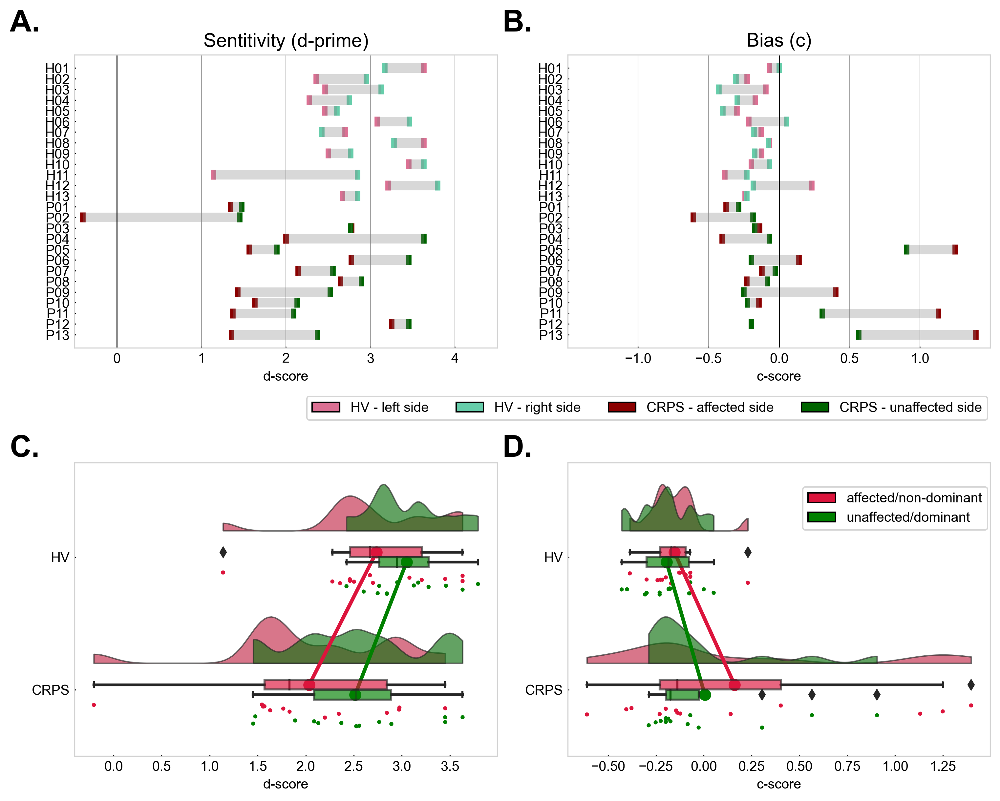

In [6]:
fig6b, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize= (10,8), dpi = 300, constrained_layout = True)

axs = [ax1, ax2, ax3, ax4]

for a, ax in enumerate(axs): 
    ax.tick_params(direction = 'in', length = 1, labelsize = 10)
    ax.spines['bottom'].set_color('lightgrey')
    ax.spines['top'].set_color('lightgrey') 
    ax.spines['right'].set_color('lightgrey')
    ax.spines['left'].set_color('lightgrey')
    if a < 2:
        # draw vertical grids
        ax.grid(which = 'major', axis = 'x', color = 'grey', linestyle ='-', linewidth = 0.5, alpha = 0.7)
        ax.axvline(x = 0, color = "black", lw = 0.7)

# Draw the sub-figure letters
fig6b.text(0.00, 0.970, "A.", fontsize = 22, fontweight = "bold")
fig6b.text(0.50, 0.970, "B.", fontsize = 22, fontweight = "bold")
fig6b.text(0.00, 0.43, "C.", fontsize = 22, fontweight = "bold")
fig6b.text(0.50, 0.43, "D.", fontsize = 22, fontweight = "bold")

# define the colors to use in the plot
col_aff = 'darkred'; col_unaff = 'darkgreen'; col_left = 'palevioletred'; col_right = 'mediumaquamarine'

# Legends for the above plots
aff_patch = mpatches.Patch(facecolor= col_aff, edgecolor='k', label='CRPS - affected side')
unaff_patch = mpatches.Patch(facecolor= col_unaff, edgecolor='k', label='CRPS - unaffected side')
left_patch = mpatches.Patch(facecolor= col_left, edgecolor='k', label='HV - left side')
right_patch = mpatches.Patch(facecolor= col_right, edgecolor='k', label='HV - right side')
# Legends for the lower plots 
bad_patch = mpatches.Patch(facecolor= 'crimson', edgecolor='k', label='affected/non-dominant')
good_patch = mpatches.Patch(facecolor= 'green', edgecolor='k', label='unaffected/dominant')
# draw legends
fig6b.legend(handles=[left_patch, right_patch, aff_patch, unaff_patch], bbox_to_anchor=(1.00, 0.515), loc='upper right', ncol=4)
fig6b.legend(handles=[bad_patch, good_patch], bbox_to_anchor=(1.00, 0.40), loc='upper right', ncol=1)

###########  SENSITIVITY AND BIAS PLOTS ##########  
    
cleveland("d", ax1, crps_sdt, [col_aff, col_unaff], adj = 0.2)
cleveland("d", ax1, hv_sdt, [col_left, col_right])

cleveland("c", ax2, crps_sdt, [col_aff, col_unaff], side = 2, other = 3)
cleveland("c", ax2, hv_sdt, [col_left, col_right], side = 2, other = 3)

###########   RAIN CLOUD PLOTS ##########  
ort = "h"; pal = ['crimson','green']; sigma = .2
rpd = pt.RainCloud(x = ds["group"], y = ds["d-score"], hue = ds["side"], data = ds, palette = pal, bw = sigma,
                   width_viol = .7, ax = ax3, orient = ort, alpha = .65, dodge = True, pointplot = True, move = .2)
ax3.get_legend().remove(); ax3.set_ylabel(' '); ax3.set_title("\n", fontsize = 14)
plt.style.use('seaborn-whitegrid')
rpc = pt.RainCloud(x = cs["group"], y = cs["c-score"], hue = cs["side"], data = cs, palette = pal, bw = sigma,
                   width_viol = .7, ax = ax4, orient = ort, alpha = .65, dodge = True, pointplot = True, move = .2)
ax4.get_legend().remove(); ax4.set_ylabel(' '); ax3.set_title("\n", fontsize = 14)

#fig6b.savefig('../R2 final/Fig6NEW.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#        transparent = False, pad_inches=0.1, frameon=True)

In [7]:
# need to reset default matplotlib parameters after using seaborn
plt.style.use('default') 

<h4><center>FIGURE 3 - SUPER-SUBJECT</center></h4> 

In [8]:
# Read in the resulting classifier timecourses
  # Thumb (vs non-thumb)
ss_1a = read_output('ss/ss_1vsall/active/1(THUMB)/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_1p = read_output('ss/ss_1vsall/passive/1(THUMB)/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')
  # Index (vs non-index)
ss_2a = read_output('ss/ss_1vsall/active/2(INDEX)/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_2p = read_output('ss/ss_1vsall/passive/2(INDEX)/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')
  # Middle (vs non-middle)
ss_3a = read_output('ss/ss_1vsall/active/3(MIDDLE)/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_3p = read_output('ss/ss_1vsall/passive/3(MIDDLE)/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')
  # Ring (vs non-ring)
ss_4a = read_output('ss/ss_1vsall/active/4(RING)/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_4p = read_output('ss/ss_1vsall/passive/4(RING)/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')
  # Little (vs non-little)
ss_5a = read_output('ss/ss_1vsall/active/5(LITTLE)/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_5p = read_output('ss/ss_1vsall/passive/5(LITTLE)/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')

# 1 VS ALL
ss_1vs5a = read_output('ss/ss_1vs5/active/ALL_NOSELECTION/CLASS_PERF_supersubject_active_10fold.mat')
ss_1vs5p = read_output('ss/ss_1vs5/passive/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')

# ALL VS ALL
ss_allvsalla = read_output('ss/ss_allvsall/active/ALL_NOSELECTION/CLASS_PERF_supersubject_active_corr_10fold.mat')
ss_allvsallp = read_output('ss/ss_allvsall/passive/ALL_NOSELECTION/CLASS_PERF_supersubject_10fold.mat')

################  Calculate the mean and SD (for plots 2C and 2D) ################ 

                                    # Passive condition
mean_1vsallp = pd.DataFrame({'m' : np.mean([ss_1p, ss_2p, ss_3p, ss_4p, ss_5p], axis=0), 
                             's' : np.std([ss_1p, ss_2p, ss_3p, ss_4p, ss_5p], axis=0)/2})
mean_1vsallp.index = time
# create a column to store significant time clusters
mean_1vsallp['sign'] = np.nan
mean_1vsallp.sign[windows['early'][0]:windows['early'][1]] = mean_1vsallp.m[windows['early'][0]:windows['early'][1]]; 
mean_1vsallp.sign[windows['mid'][0]:windows['mid'][1]] = mean_1vsallp.m[windows['mid'][0]:windows['mid'][1]]

                                     # Active condition 
mean_1vsalla = pd.DataFrame({'m' : np.mean([ss_1a, ss_2a, ss_3a, ss_4a, ss_5a], axis=0), 
                             's' : np.std([ss_1a, ss_2a, ss_3a, ss_4a, ss_5a], axis=0)/2})
mean_1vsalla.index = time
# create a column to store significant time clusters
mean_1vsalla['sign'] = np.nan
mean_1vsalla.sign[windows['late'][0]:windows['late'][1]] = mean_1vsalla.m[windows['late'][0]:windows['late'][1]]


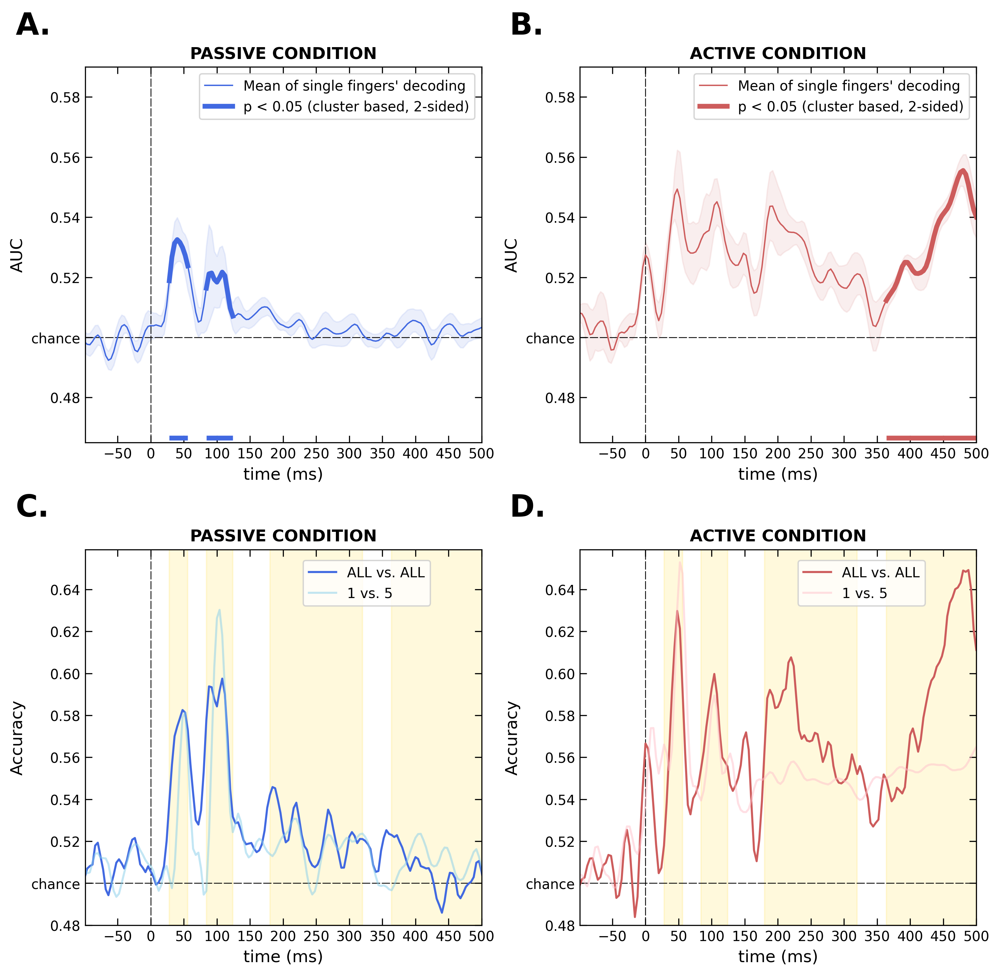

In [9]:
# Initialize figure with high resolution 
fig2, axs = plt.subplots(2, 2, figsize= (10,9.75), dpi = 300, constrained_layout = True)

# Set values ranges for all time axes 
plt.setp(axs, xlim = (-99, 500))

# Draw the sub-figure letters
fig2.text(0.01, 0.970, "A.", fontsize = 22, fontweight = "bold"); fig2.text(0.51, 0.970, "B.", fontsize = 22, fontweight = "bold")
fig2.text(0.01, 0.470, "C.", fontsize = 22, fontweight = "bold"); fig2.text(0.51, 0.470, "D.", fontsize = 22, fontweight = "bold")

for i in range(2): 
    for j in range(2):
        # set tiles
        axs[i,0].set_title('\n\nPASSIVE CONDITION', fontweight = 'bold')
        axs[i,1].set_title('\n\nACTIVE CONDITION', fontweight = 'bold')
        # draw dashed line for stimulus onset
        axs[i,j].axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # draw lines for chance level
        axs[i,j].axhline(y = 0.5, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # set y-limits
        axs[0,j].set_ylim(0.465,0.59); axs[1,j].set_ylim(0.49,0.659)
        # move ticks inside the graph and make them longer
        axs[i,j].tick_params(direction = 'in', length = 5, labelsize = 10, bottom = True, top = True, left = True, 
                             right = True, labelbottom = True, labeltop = False, labelleft = True, labelright = False)
        # adjust time ticks to every 50 ms and set label
        axs[i,j].set_xticks(np.arange(-50, 501, 50))
        axs[i,j].set_xlabel('time (ms)', fontsize = 12)
        # indicate the level of chance with a labelled tick
        ticks = np.arange(0.48, 0.59, 0.02) if i < 1 else np.arange(0.48, 0.65, 0.02)
        axs[i,j].set_yticks(ticks)
        ticklabs = [str(item)[0:4] for item in ticks]
        ticklabs[1] = 'chance'
        axs[i,j].set_yticklabels(ticklabs)
        # set measure label
        meas = 'AUC' if i < 1 else 'Accuracy'
        axs[i,j].set_ylabel(meas, fontsize = 12)
        # draw windows in 2E an 2F
        axs[1,j].axvspan(windows['early'][0], windows['early'][1], color = 'gold', alpha = 0.07)
        axs[1,j].axvspan(windows['mid'][0], windows['mid'][1], color = 'gold', alpha = 0.07)
        axs[1,j].axvspan(windows['midlate'][0], windows['midlate'][1], color = 'gold', alpha = 0.07)
        axs[1,j].axvspan(windows['late'][0], windows['late'][1], color = 'gold', alpha = 0.07)

# ------------------------------------------------------------------------------------------ #
                           # MEAN OF INDIVIDUAL FINGERS (A and B)
rug = axs[0,0].get_ylim()[0]+0.0015;
  # Passive condition
col_p = 'royalblue'
axs[0,0].plot(time, mean_1vsallp['m'], color = col_p, lw = 1, label = "Mean of single fingers' decoding") # mean curve
axs[0,0].fill_between(time, mean_1vsallp['m']-mean_1vsallp['s'], mean_1vsallp['m']+mean_1vsallp['s'], 
                      color = col_p, alpha = 0.1) # std curves
axs[0,0].plot(time, mean_1vsallp['sign'], color = col_p, lw = 3.5, label = "p < 0.05 (cluster based, 2-sided)")
axs[0,0].hlines(y = rug, xmin = windows['early'][0], xmax = windows['early'][1], color = col_p, lw = 3.5)
axs[0,0].hlines(y = rug, xmin = windows['mid'][0], xmax = windows['mid'][1], color = col_p, lw = 3.5)
axs[0,0].legend(loc = "upper right")
  # Active condition
col_a = 'indianred'
axs[0,1].plot(time, mean_1vsalla['m'], color = col_a, lw = 1, label = "Mean of single fingers' decoding") # mean curve
axs[0,1].fill_between(time, mean_1vsalla['m']-mean_1vsalla['s'], mean_1vsalla['m']+mean_1vsalla['s'], 
                      color = col_a, alpha = 0.1) # std curves
axs[0,1].plot(time, mean_1vsalla['sign'], color = col_a, lw = 3.5, label = "p < 0.05 (cluster based, 2-sided)")
axs[0,1].hlines(y = rug, xmin = windows['late'][0], xmax = windows['late'][1], color = col_a, lw = 3.5)
axs[0,1].legend(loc = "upper right")

# ------------------------------------------------------------------------------------------ #
                                 # 1vs5 AND ALLvsALL (C and D)
w = 1.5
  # Passive condition
axs[1,0].plot(time, ss_allvsallp*2.5, lw = w, label = "ALL vs. ALL", color = col_p)
axs[1,0].plot(time, ss_1vs5p, lw = w, label = "1 vs. 5", color = "skyblue", alpha = 0.5)
axs[1,0].legend(loc = (0.55, 0.85))
  # Active condition
axs[1,1].plot(time, ss_allvsalla*2.5, lw = w, label = "ALL vs. ALL", color = col_a)
axs[1,1].plot(time, ss_1vs5a, lw = w, label = "1 vs. 5", color = "pink", alpha = 0.5)
axs[1,1].legend(loc = (0.55, 0.85))

# fig2.savefig('../Final_figures/Fig3.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#         transparent = False, pad_inches=0.1, frameon=True)

<h4><center>FIGURE 4 - GROUP RESULTS</center></h4> 

In [10]:
# Read in group results and create a daframe from each condition-side-group
group_paths = [ 'allvsall/CRPS active/affected_active/ALL_NOSELECTION/',
                'allvsall/CRPS passive/affected_passive/ALL_NOSELECTION/',
                'allvsall/CRPS active/unaffected_active/ALL_NOSELECTION/',
                'allvsall/CRPS passive/unaffected_passive/ALL_NOSELECTION/',
                'allvsall/HV active/left_active/ALL_NOSELECTION/',
                'allvsall/HV passive/left_passive/ALL_NOSELECTION/',
                'allvsall/HV active/right_active/ALL_NOSELECTION/',
                'allvsall/HV passive/right_passive/ALL_NOSELECTION/']
group_dfnames = ['a_aff','p_aff','a_unaff','p_unaff','a_left','p_left', 'a_right', 'p_right']

build_dataframes(group_paths, group_dfnames)

stack_sides(p_left, p_right, 'p_hv'); stack_sides(a_left, a_right, 'a_hv')
stack_sides(p_aff, p_unaff, 'p_crps'); stack_sides(a_aff, a_unaff, 'a_crps');


In [11]:
# Read in CORRECT ONLY group results and create a daframe from each condition-side-group
noerr_paths = ['NoErr/affected/ALL_NOSELECTION/','NoErr/unaffected/ALL_NOSELECTION/',
               'NoErr/left/ALL_NOSELECTION/','NoErr/right/ALL_NOSELECTION/',
               'NoErr/CRPS/ALL_NOSELECTION/','NoErr/HV/ALL_NOSELECTION/',]

noerr_dfnames = ['aff_cor','unaff_cor','left_cor','right_cor', 'CRPS_cor', 'HV_cor']

build_dataframes(noerr_paths[:2], noerr_dfnames[:2], 12) # 1 file lost (lack of training examples)
build_dataframes(noerr_paths[2:4], noerr_dfnames[2:4]) # no files lost
build_dataframes([noerr_paths[4]], [noerr_dfnames[4]], 21) # 5 total lost (P14, P20 and left P18)
build_dataframes([noerr_paths[5]], [noerr_dfnames[5]], 26) # no files lost

# Read in >500ms responses ONLY results and create a daframe from each condition-side-group
no500_paths = ['No500/affected/ALL_NOSELECTION/','No500/unaffected/ALL_NOSELECTION/',
              'No500/left/ALL_NOSELECTION/','No500/right/ALL_NOSELECTION/']

no500_dfnames = ['aff_500','unaff_500','left_500','right_500']

build_dataframes(no500_paths[:2], no500_dfnames[:2], filtr =(17,13)) # no files lost 
build_dataframes(no500_paths[2:], no500_dfnames[2:], 12, filtr =(17,13)) # 1 file lost (lack of training examples)

In [12]:
# Extract the significant clusters obtained from permutation test
cluster = read_pstruct(['allvsall', 'NoErr', 'No500'])

# reorder dfs to correspond to order in which results are presented in the pstruct files
dfs = [a_hv, a_crps, p_hv, p_crps, a_left, a_right, a_aff, a_unaff, p_left, p_right, 
       p_aff, p_unaff, HV_cor, CRPS_cor, left_cor, right_cor, aff_cor, unaff_cor, 
      left_500, right_500, aff_500, unaff_500] 

# fill in sign column with timeseries 
for i, k in enumerate(cluster.keys()):
    for s in range(0, len(cluster[k]), 2):
        dfs[i].loc[cluster[k][s]:cluster[k][s+1],'sign'] = dfs[i].loc[cluster[k][s]:cluster[k][s+1],'m']
    

<ipython-input-13-25f6035a282f>:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig3.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/Fig4.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',


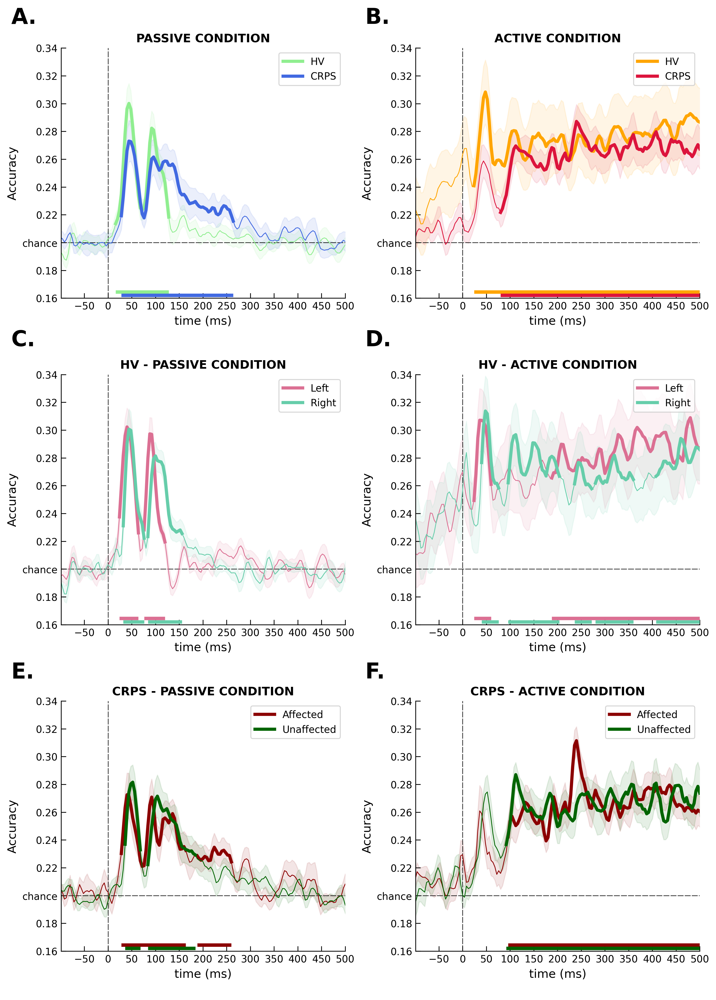

In [13]:
# Initialize figure with high resolution 
fig3, axs = plt.subplots(3, 2, figsize= (10,14), dpi = 300, constrained_layout = True)

# Set values ranges for all time axes 
plt.setp(axs, xlim = (-99, 500), ylim = (0.16,0.34))

# Draw the sub-figure letters
fig3.text(0.01, 0.980, "A.", fontsize = 22, fontweight = "bold")
fig3.text(0.51, 0.980, "B.", fontsize = 22, fontweight = "bold")
fig3.text(0.01, 0.655, "C.", fontsize = 22, fontweight = "bold")
fig3.text(0.51, 0.655, "D.", fontsize = 22, fontweight = "bold")
fig3.text(0.01, 0.320, "E.", fontsize = 22, fontweight = "bold")
fig3.text(0.51, 0.320, "F.", fontsize = 22, fontweight = "bold")

for i in range(3): 
    for j in range(2):
        # draw dashed line for stimulus onset
        axs[i,j].axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # draw lines for chance level
        axs[i,j].axhline(y = 0.2, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # remove top and right axes
        axs[i,j].spines['right'].set_visible(False)
        axs[i,j].spines['top'].set_visible(False)
        # move ticks inside the graph and make them longer
        axs[i,j].tick_params(direction = 'in', length = 5, labelsize = 10)
        # adjust time ticks to every 50 ms and set label
        axs[i,j].set_xticks(np.arange(-50, 501, 50))
        axs[i,j].set_xlabel('time (ms)\n', fontsize = 12)
        # indicate the level of chance with a labelled tick
        tcks = np.arange(0.16, 0.36, 0.02)
        axs[i,j].set_yticks(tcks)
        ticklabs = ['0.16','0.18','chance','0.22','0.24','0.26','0.28','0.30','0.32', '0.34']
        axs[i,j].set_yticklabels(ticklabs)
        # set measure label
        axs[i,j].set_ylabel('Accuracy', fontsize = 12)
        # set position of rugs
        rug = axs[i,j].get_ylim()[0]+0.002

                                        # GROUP COMPARISON

  # Passive condition
mvpaplot(axs[0,0], p_hv, 'HV passive', 'HV', c = 'lightgreen', low_rug = False)
mvpaplot(axs[0,0], p_crps, 'CRPS passive', 'CRPS', c = 'royalblue', title = '\n\nPASSIVE CONDITION')
axs[0,0].legend(loc = 'upper right')

  # Active condition
mvpaplot(axs[0,1], HV_cor, 'HV', 'HV', c = 'orange', low_rug = False)
mvpaplot(axs[0,1], CRPS_cor, 'CRPS', 'CRPS', c = 'crimson', title = '\n\nACTIVE CONDITION')
axs[0,1].legend(loc = 'upper right')

# ------------------------------------------------------------------------------------------ #
                                        # HV LEFT VS RIGHT 
  
    # Passive condition
mvpaplot(axs[1,0], p_left, 'left_passive', 'Left', c = 'palevioletred', low_rug = False)
mvpaplot(axs[1,0], p_right, 'right_passive', 'Right', c = 'mediumaquamarine', title = '\nHV - PASSIVE CONDITION')
axs[1,0].legend(loc = 'upper right')


  # Active condition
mvpaplot(axs[1,1], left_cor, 'left', 'Left', c = 'palevioletred', low_rug = False)
mvpaplot(axs[1,1], right_cor, 'right', 'Right', c = 'mediumaquamarine', title = '\nHV - ACTIVE CONDITION')
axs[1,1].legend(loc = 'upper right')


# ------------------------------------------------------------------------------------------ #
                                    # CRPS AFFECTED VS UNAFFECTED 

  # Passive condition
mvpaplot(axs[2,0], p_aff, 'affected_passive', 'Affected', c = 'darkred', low_rug = False)
mvpaplot(axs[2,0], p_unaff, 'unaffected_passive', 'Unaffected', c = 'darkgreen', title = '\nCRPS - PASSIVE CONDITION')
axs[2,0].legend(loc = 'upper right')


  # Active condition
mvpaplot(axs[2,1], aff_cor, 'affected', 'Affected', c = 'darkred', low_rug = False)
mvpaplot(axs[2,1], unaff_cor, 'unaffected', 'Unaffected', c = 'darkgreen', title = '\nCRPS - ACTIVE CONDITION')
axs[2,1].legend(loc = 'upper right')

fig3.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/Fig4.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
         transparent = False, pad_inches=0.1, frameon=True)

<h4><center>FIGURE 5 - TEMPORAL GENERALIZATION</center></h4> 

In [25]:
from functools import reduce

In [29]:
tgm_paths = ['TGM_sides/aff_noerr/ALL_NOSELECTION/', 'TGM_sides/aff_passive/ALL_NOSELECTION/',
            'TGM_sides/unaff_noerr/ALL_NOSELECTION/', 'TGM_sides/unaff_passive/ALL_NOSELECTION/',
            'TGM/HV_active/ALL_NOSELECTION/', 'TGM/HV_passive/ALL_NOSELECTION/']

tgm_dfnames = ['a_aff_tgm','p_aff_tgm','a_unaff_tgm','p_unaff_tgm','a_hv_tgm','p_hv_tgm']

for i in range(6):
    
    os.chdir(PATH + tgm_paths[i])
    ls_pp = list()
    
    for n, file in enumerate(glob.glob("*.mat")):
        o = read_output(tgm_paths[i] + file, output_type = 'tgm')
        o.index = time.astype(int)
        o.columns = time.astype(int)
        ls_pp.append(o.loc[-100:500,:])
    
    globals()[tgm_dfnames[i]] = reduce(lambda x, y: x.add(y), ls_pp) / len(ls_pp)


<ipython-input-33-57d095cd2745>:58: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig5.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/Fig5.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',


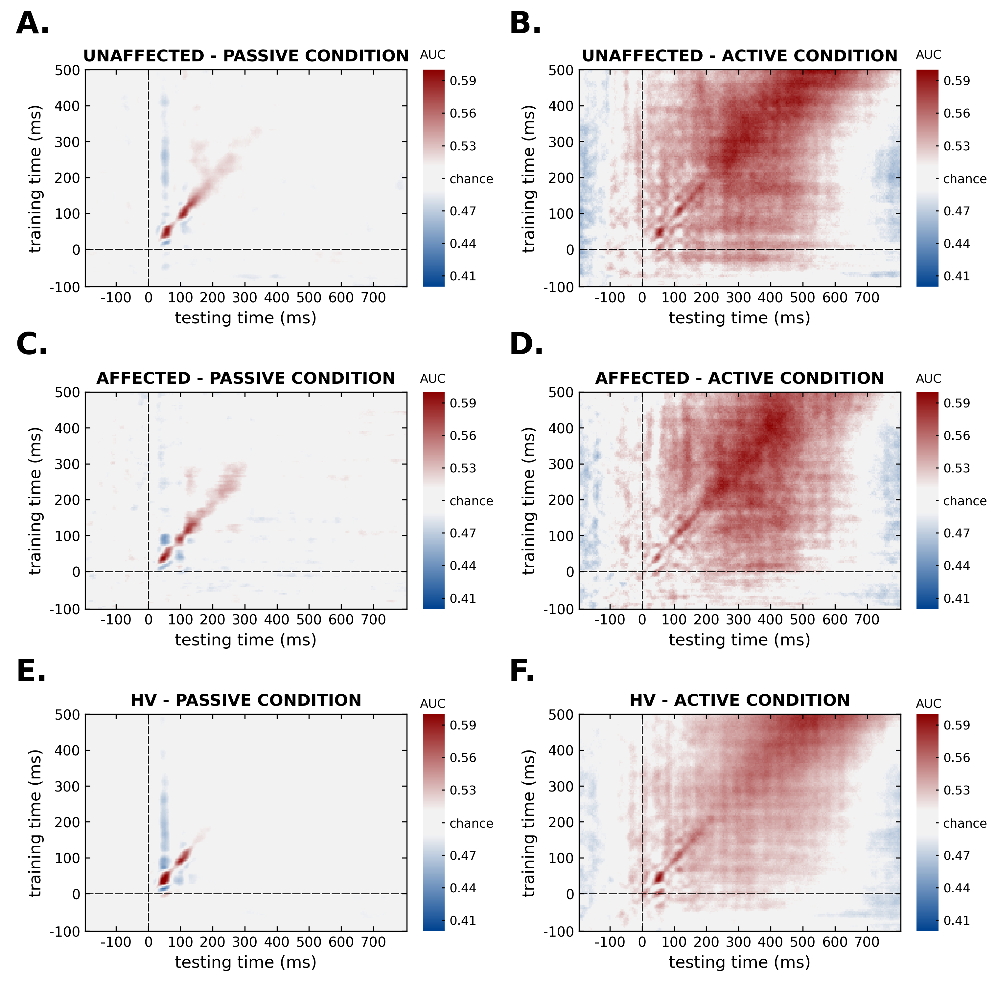

In [33]:
# Initialize figure with high resolution 
fig5, ([ax1, ax2], [ax3, ax4], [ax5, ax6]) = plt.subplots(3, 2, figsize= (10,10), dpi = 300, constrained_layout = True)

axs = [ax1, ax2, ax3, ax4, ax5, ax6]
tgm_dfs = [p_unaff_tgm, a_unaff_tgm, p_aff_tgm, a_aff_tgm, p_hv_tgm, a_hv_tgm]
titles = ['\n\nUNAFFECTED - PASSIVE CONDITION','\n\nUNAFFECTED - ACTIVE CONDITION', '\nAFFECTED - PASSIVE CONDITION', 
          '\nAFFECTED - ACTIVE CONDITION', '\nHV - PASSIVE CONDITION','\nHV - ACTIVE CONDITION']


# Draw the sub-figure letters
fig5.text(0.01, 0.975, "A.", fontsize = 22, fontweight = "bold")
fig5.text(0.51, 0.975, "B.", fontsize = 22, fontweight = "bold")
fig5.text(0.01, 0.649, "C.", fontsize = 22, fontweight = "bold")
fig5.text(0.51, 0.649, "D.", fontsize = 22, fontweight = "bold")
fig5.text(0.01, 0.317, "E.", fontsize = 22, fontweight = "bold")
fig5.text(0.51, 0.317, "F.", fontsize = 22, fontweight = "bold")

up = 0.949; mdle = 0.620; down = 0.290; lf = 0.42; rt = 0.923
fig5.text(lf, up, "AUC", fontsize = 9); fig5.text(rt, up, "AUC", fontsize = 9)
fig5.text(lf, mdle, "AUC", fontsize = 9); fig5.text(rt, mdle, "AUC", fontsize = 9)
fig5.text(lf, down, "AUC", fontsize = 9); fig5.text(rt, down, "AUC", fontsize = 9)

clrs = sns.diverging_palette(250, 17, s=150, l=27, sep=30, n=15, as_cmap=True)

for i, ax in enumerate(axs):
    # define the time ticks 
    ts = [i for i, t in enumerate(time[1:]) if t % 50 == 0 or int(t) == 0]
    tslab = [-100, 0, 100, 200, 300, 400, 500, 600, 700]
    tstest = [151, 125, 100, 75, 50, 25, 0]
    tslabtest = ['-100', '0', '100', '200', '300', '400', '500'] # [500, 400, 300, 200, 100, 0, -100]
    # set title
    ax.set_title(titles[i], fontweight = 'bold')
    # draw output
    p = sns.heatmap(tgm_dfs[i].iloc[::-1], ax=ax, cmap=clrs, center=0.5, vmin=0.4, vmax=0.6,
                    cbar_kws={'format': '%.2f', 'ticks': [0.41, 0.44, 0.47, 0.50, 0.53, 0.56, 0.59], 'aspect' : 10})
    cbar = p.collections[0].colorbar
    cbar.set_ticklabels(['0.41', '0.44', '0.47', 'chance', '0.53', '0.56', '0.59'])
    cbar.ax.tick_params(direction='in', length = 2, labelsize=9)
    #cbar.ax.spines['top'].set_visible(True); cbar.ax.spines['bottom'].set_visible(True); 
    #cbar.ax.spines['left'].set_visible(True); cbar.ax.spines['right'].set_visible(True)
    # add border
    ax.spines['top'].set_visible(True); ax.spines['bottom'].set_visible(True); 
    ax.spines['left'].set_visible(True); ax.spines['right'].set_visible(True)
    # adjust the ticks
    ax.set_xticks(ts)
    ax.set_xticklabels(tslab)
    ax.set_yticks(tstest)
    ax.set_yticklabels(tslabtest)
    ax.tick_params(axis='both', direction='in', labelsize=10, bottom = True, top = True, left = True, right = True,
                  labelbottom = True, labeltop = False, labelleft = True, labelright = False, labelrotation = 0)
    # draw dashed line for stimulus onset
    ax.axvline(x = 49, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    ax.axhline(y = 125, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # labels
    ax.set_ylabel('\ntraining time (ms)', fontsize = 12)
    ax.set_xlabel('testing time (ms)\n', fontsize = 12)

fig5.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/Fig5.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
         transparent = False, pad_inches=0.1, frameon=True)

<h4><center>SUPPLEMENTARY FIGURE 1 - SUPER-SUBJECT INDIVIDUAL FINGERS</center></h4> 

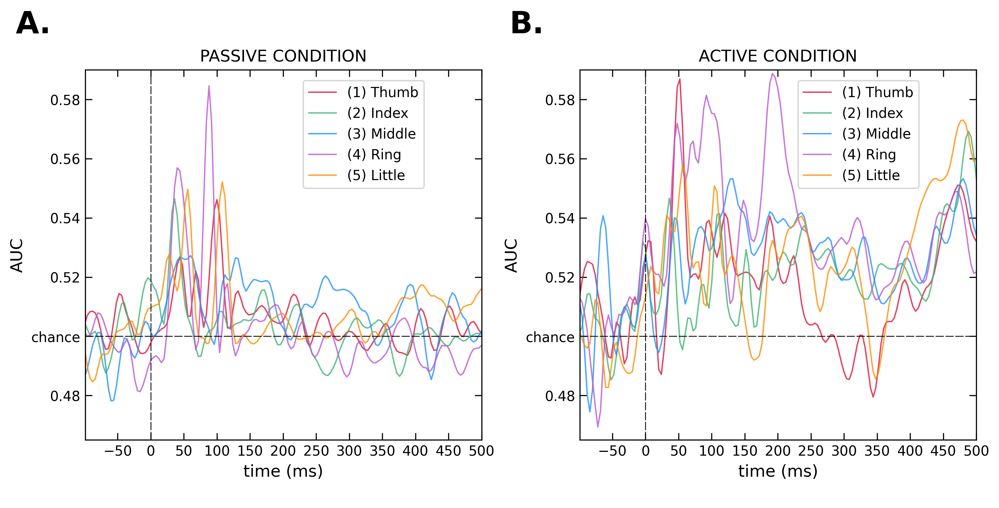

In [16]:
# Supplementary figure 1         # INDIVIDUAL FINGERS
sfig1, (axp, axa) = plt.subplots(1, 2, figsize= (10,5), dpi = 300, constrained_layout = True)
axs = [axp, axa]

# Set axes limits 
plt.setp([ax for ax in axs], xlim = (-99, 500), ylim =(0.465,0.59))

# Draw letters for reference
sfig1.text(0.01, 0.950, "A.", fontsize = 22, fontweight = "bold"); 
sfig1.text(0.51, 0.950, "B.", fontsize = 22, fontweight = "bold")

# set titles
axp.title.set_text('\n\nPASSIVE CONDITION'); 
axa.title.set_text('\n\nACTIVE CONDITION');

a = 0.8; w = 1
ptc = [ss_1p, ss_2p, ss_3p, ss_4p, ss_5p]; atc = [ss_1a, ss_2a, ss_3a, ss_4a, ss_5a]
labels = ["(1) Thumb", "(2) Index", "(3) Middle", "(4) Ring", "(5) Little"]
clrs = ['crimson', 'mediumseagreen', 'dodgerblue', 'mediumorchid', 'darkorange']

for i in range(5):
    # passive finger timecourses
    axp.plot(time, ptc[i], alpha = a, lw = w, label = labels[i], color = clrs[i])
    # active finger timecourses
    axa.plot(time, atc[i], alpha = a, lw = w, label = labels[i], color = clrs[i])

for ax in axs:
    # draw dashed line for stimulus onset
    ax.axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # draw lines for chance level
    ax.axhline(y = 0.5, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # move ticks inside the graph and make them longer
    ax.tick_params(direction = 'in', length = 5, labelsize = 10, bottom = True, top = True, left = True, 
                   right = True, labelbottom = True, labeltop = False, labelleft = True, labelright = False)
    # adjust time ticks to every 50 ms and set label
    ax.set_xticks(np.arange(-50, 501, 50))
    ax.set_xlabel('time (ms)\n', fontsize = 12)
    # indicate the level of chance with a labelled tick
    ticks = np.arange(0.48, 0.59, 0.02)
    ax.set_yticks(ticks)
    ticklabs = [str(item)[0:4] for item in ticks]
    ticklabs[1] = 'chance'
    ax.set_yticklabels(ticklabs)
    # set measure label
    ax.set_ylabel('AUC', fontsize = 12)
    ax.legend(loc = (0.55, 0.68))

# Save the figure with resolution 300 dpi
# sfig1.savefig('../Final_figures/Supp1.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#         transparent = False, pad_inches=0.1, frameon=True)

<h4><center>SUPPLEMENTARY FIGURE 2 - INTERINDIVIDUAL VARIABILITY</center></h4> 

In [17]:
# retrieve the data
hv_dec = pd.read_excel('/Users/Serena/Desktop/Cognitive Neuropsychology/M-thesis/Statistical Analysis/hv.xlsx',  
                       engine='openpyxl').rename(columns={'Unnamed: 0': 'id', 'CONDIITON':'condition'})
crps_dec = pd.read_excel('/Users/Serena/Desktop/Cognitive Neuropsychology/M-thesis/Statistical Analysis/crps.xlsx', 
                        engine='openpyxl').rename(columns={'Unnamed: 0': 'id', 'CONDIITON':'condition'});

# Create dataframes holding decodability differences between hands
hv_sum_dec = pd.DataFrame(columns = ('p_early','a_early','p_mid','a_mid','p_ml','a_ml','p_late','a_late'), 
                          index = ['H01','H02','H03','H04','H05','H06','H07','H08','H09','H10','H11','H12','H13'])
crps_sum_dec = pd.DataFrame(columns = ('p_early','a_early','p_mid','a_mid','p_ml','a_ml','p_late','a_late'),  
                            index = ['P01','P02','P03','P04','P05','P06','P07','P08','P09','P10','P11','P12','P13'])

old_ids = ['H07', 'H08', 'H10', 'H11', 'H14', 'H16', 'H17', 'H19', 'H20', 'H21','H22', 'H23', 'H25',
           "P04", "P07", "P08", "P10", "P12", "P13", "P14", "P15", "P16", "P17", "P18", "P19", "P20"]

for i in range(13):
    participant = hv_dec[hv_dec.id == old_ids[i]]
    pas = participant[participant.condition == "Passive"]
    act = participant[participant.condition == "Active"]
    hv_sum_dec.iloc[i] = [float(pas.EARLY[pas.HAND == "Affected / non-dominant"]) - float(pas.EARLY[pas.HAND == "Unaffected / dominant"]),
                          float(act.EARLY[act.HAND == "Affected / non-dominant"]) - float(act.EARLY[act.HAND == "Unaffected / dominant"]),
                          float(pas.MID[pas.HAND == "Affected / non-dominant"]) - float(pas.MID[pas.HAND == "Unaffected / dominant"]),
                          float(act.MID[act.HAND == "Affected / non-dominant"]) - float(act.MID[act.HAND == "Unaffected / dominant"]),
                          float(pas.MIDLATE[pas.HAND == "Affected / non-dominant"]) - float(pas.MIDLATE[pas.HAND == "Unaffected / dominant"]),
                          float(act.MIDLATE[act.HAND == "Affected / non-dominant"]) - float(act.MIDLATE[act.HAND == "Unaffected / dominant"]),
                          float(pas.LATE[pas.HAND == "Affected / non-dominant"]) - float(pas.LATE[pas.HAND == "Unaffected / dominant"]),
                          float(act.LATE[act.HAND == "Affected / non-dominant"]) - float(act.LATE[act.HAND == "Unaffected / dominant"])]
    patient = crps_dec[crps_dec.id == old_ids[13+i]]
    ps = patient[patient.condition == "Passive"]
    at = patient[patient.condition == "Active"]
    crps_sum_dec.iloc[i] = [float(ps.EARLY[ps.HAND == "Affected / non-dominant"]) - float(ps.EARLY[ps.HAND == "Unaffected / dominant"]),
                          float(at.EARLY[at.HAND == "Affected / non-dominant"]) - float(at.EARLY[at.HAND == "Unaffected / dominant"]),
                          float(ps.MID[ps.HAND == "Affected / non-dominant"]) - float(ps.MID[ps.HAND == "Unaffected / dominant"]),
                          float(at.MID[at.HAND == "Affected / non-dominant"]) - float(at.MID[at.HAND == "Unaffected / dominant"]),
                          float(ps.MIDLATE[ps.HAND == "Affected / non-dominant"]) - float(ps.MIDLATE[ps.HAND == "Unaffected / dominant"]),
                          float(at.MIDLATE[at.HAND == "Affected / non-dominant"]) - float(at.MIDLATE[at.HAND == "Unaffected / dominant"]),
                          float(ps.LATE[ps.HAND == "Affected / non-dominant"]) - float(ps.LATE[ps.HAND == "Unaffected / dominant"]),
                          float(at.LATE[at.HAND == "Affected / non-dominant"]) - float(at.LATE[at.HAND == "Unaffected / dominant"])]
crps_sum_dec = crps_sum_dec.iloc[::-1]
hv_sum_dec = hv_sum_dec.iloc[::-1]

# restructure the dataframe so it is suitable for other plot
cond = np.repeat(np.array([0, 1]), [13, 13], axis=0)

for g in range(2):
    if g == 0:
        ids = ["H01-1","H02-1","H03-1","H04-1","H05-1","H06-1","H07-1","H08-1","H09-1","H10-1","H11-1","H12-1","H13-1",
               "H01-2","H02-2","H03-2","H04-2","H05-2","H06-2","H07-2","H08-2","H09-2","H10-2","H11-2","H12-2","H13-2"]
        new = ['he', 'hm', 'hml', 'hl']
        group = hv_sum_dec
    else:
        ids = ["P01-1","P02-1","P03-1","P04-1","P05-1","P06-1","P07-1","P08-1","P09-1","P10-1","P11-1","P12-1","P13-1",
               "P01-2","P02-2","P03-2","P04-2","P05-2","P06-2","P07-2","P08-2","P09-2","P10-2","P11-2","P12-2","P13-2"]
        new = ['ce', 'cm', 'cml', 'cl']
        group = crps_sum_dec
    for i in range(0,8,2):
        k = pd.DataFrame()
        k['diff'] = list(pd.concat([group.iloc[:,i], group.iloc[:,i+1]]))
        k['cond'], k['ids'] = cond, ids
        k = k.sort_values(by=["ids", "cond"]).reset_index(drop=True)
        k.index = k.ids
        k = k.drop('ids', axis=1)
        globals()['%s' %new[int(i/2)]] = k
        
# group them in a list
conds = [ce, cm, cml, cl, he, hm, hml, hl]

<ipython-input-18-23f529ae8130>:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1,j].set_yticklabels(['H13','H12','H11','H10','H09','H08','H07','H06','H05','H04','H03','H02','H01'])


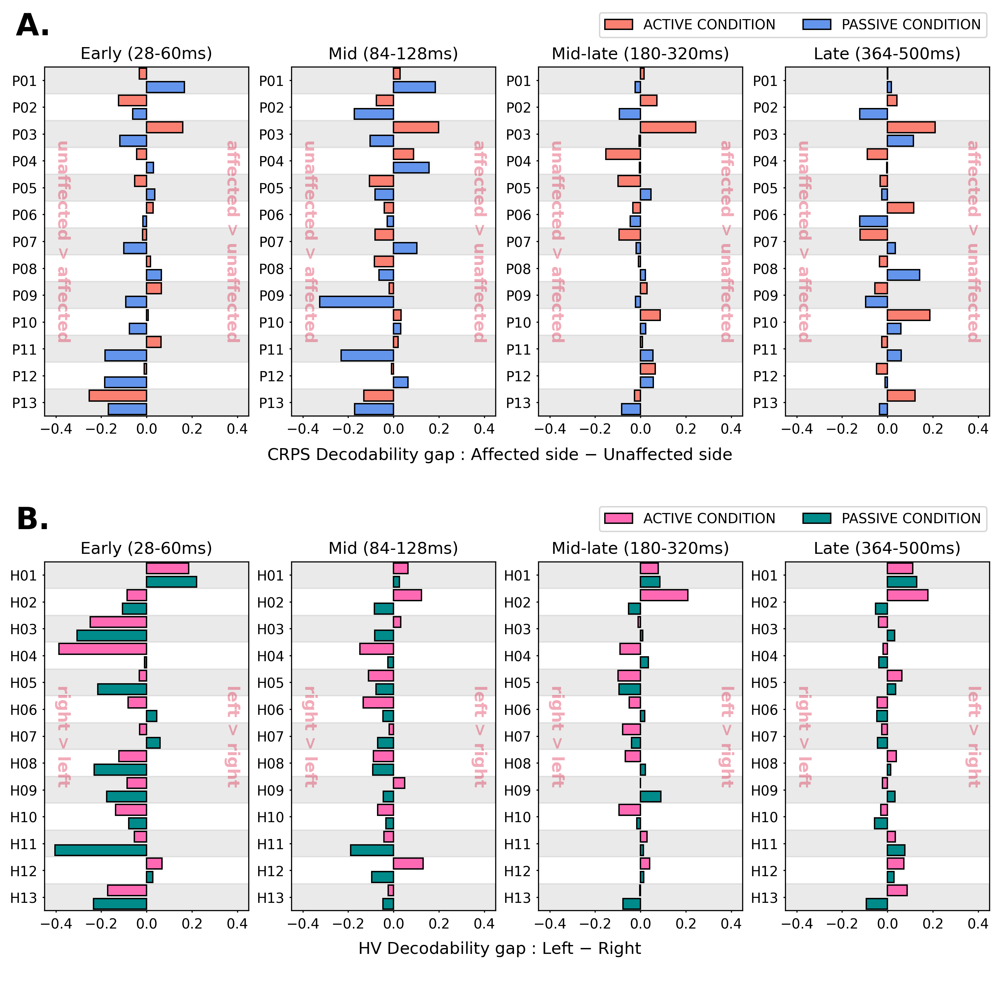

In [18]:
# Initialize figure with high resolution 
fig4x, axs = plt.subplots(2, 4, figsize= (10,10), dpi = 300, constrained_layout = True, sharex = 'row')

# Set values ranges for all time axes 
plt.setp(axs, xlim = (-0.45, 0.45), ylim = (-0.5, 25.5))

# Draw the sub-figure letters
fig4x.text(0.01, 0.970, "A.", fontsize = 22, fontweight = "bold")
fig4x.text(0.01, 0.470, "B.", fontsize = 22, fontweight = "bold")
fig4x.text(0.50, 0.54, r'CRPS Decodability gap : Affected side $-$ Unaffected side', fontsize = 12, ha='center')
fig4x.text(0.50, 0.04, r'HV Decodability gap : Left $-$ Right', fontsize = 12, ha='center')

# Legends 
a_crps_patch = mpatches.Patch(facecolor='salmon', edgecolor='black', label='ACTIVE CONDITION')
p_crps_patch = mpatches.Patch(facecolor='cornflowerblue', edgecolor='black', label='PASSIVE CONDITION')
a_hv_patch = mpatches.Patch(facecolor='hotpink', edgecolor='black', label='ACTIVE CONDITION')
p_hv_patch = mpatches.Patch(facecolor='darkcyan', edgecolor='black', label='PASSIVE CONDITION')
fig4x.legend(handles=[a_crps_patch, p_crps_patch], bbox_to_anchor=(1.00, 0.9995), loc='upper right', ncol=2)
fig4x.legend(handles=[a_hv_patch, p_hv_patch], bbox_to_anchor=(1.00, 0.4995), loc='upper right', ncol=2)

for i in range(2): 
    for j in range(4):
        # set titles
        axs[i,0].title.set_text('\n\nEarly (28-60ms)')
        axs[i,1].title.set_text('\n\nMid (84-128ms)')
        axs[i,2].title.set_text('\n\nMid-late (180-320ms)')
        axs[i,3].title.set_text('\n\nLate (364-500ms)')
        # ticks and label
        axs[i,j].tick_params(direction = 'out', length = 1.5, labelsize = 10)
        axs[i,j].set_xticks(np.arange(-0.4, 0.6, 0.20))
        
        axs[0,j].set_xlabel('\n\n ', fontsize = 12)
        axs[1,j].set_xlabel('\n\n ', fontsize = 12)
        # participant tick
        axs[i,j].set_yticks(np.arange(0.5, 25, 2))
        axs[0,j].set_yticklabels(['P13','P12','P11','P10','P09','P08','P07','P06','P05','P04','P03','P02','P01'])
        axs[1,j].set_yticklabels(['H13','H12','H11','H10','H09','H08','H07','H06','H05','H04','H03','H02','H01'])
        # distinguish participants
        start, end = -0.5, 1.5
        for y in range(7):
            axs[i,j].axhspan(start+y*4, end+y*4, color = 'grey', alpha = 0.16)
        # txt 
        axs[0,j].text(0.88, 0.5, "affected > unaffected", fontsize = 12, rotation=270, fontweight = "bold",
                      va='center', transform=axs[0,j].transAxes, color = 'crimson', alpha = 0.2)
        axs[0,j].text(0.05, 0.5, "unaffected > affected", fontsize = 12, rotation=270, fontweight = "bold",
                      va='center', transform=axs[0,j].transAxes, color = 'crimson', alpha = 0.2)
        axs[1,j].text(0.88, 0.5, "left > right", fontsize = 12, rotation=270, fontweight = "bold",
                      va='center', transform=axs[1,j].transAxes, color = 'crimson', alpha = 0.2)
        axs[1,j].text(0.05, 0.5, "right > left", fontsize = 12, rotation=270, fontweight = "bold",
                      va='center', transform=axs[1,j].transAxes, color = 'crimson', alpha = 0.2)
        
for n, c in enumerate(conds):
    if n < 4:
        clrs = ['salmon' if (x > 0) else 'cornflowerblue' for x in c.iloc[:,1] ] 
        axs[0, int(n)].barh(c.index, c.iloc[:,0], color = clrs, edgecolor = 'black')
    else:
        clrs = ['hotpink' if (x > 0) else 'darkcyan' for x in c.iloc[:,1] ] 
        axs[1, int(n-4)].barh(c.index, c.iloc[:,0], color = clrs, edgecolor = 'black')

# fig4x.savefig('../Final_figures/Supp2.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#        transparent = False, pad_inches=0.1, frameon=True)

<h4><center>SUPPLEMENTARY FIGURE 3 - UPPER VS. LOWER LIMB</center></h4> 

In [19]:
################################ UP vs LOW ######################################
# Read in group results and create a daframe from each condition-side-group
uplow_paths = ['allvsall/UPvsLOW/UP_passive/','allvsall/UPvsLOW/LOW_passive/', 
               'allvsall/UPvsLOW/UP_active/','allvsall/UPvsLOW/LOW_active/']
uplow_dfnames = ['p_upp','p_low','a_upp','a_low']
            
build_dataframes(uplow_paths, uplow_dfnames)

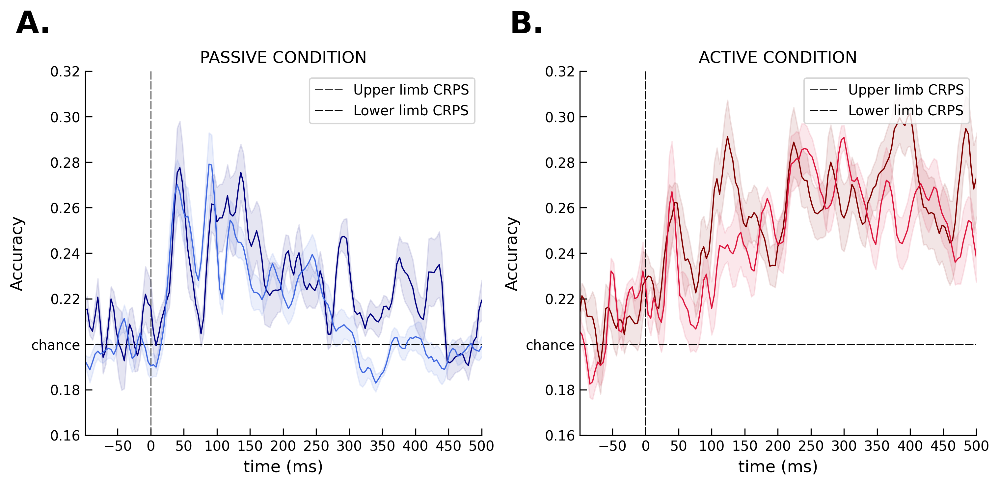

In [20]:
# Initialize figure with high resolution 
sfig4, axs = plt.subplots(1, 2, figsize= (10,4.75), dpi = 300, constrained_layout = True)
# Set values ranges for all time axes 
plt.setp(axs, xlim = (-99, 500), ylim = (0.16,0.32))

# Draw the sub-figure letters
sfig4.text(0.01, 0.950, "A.", fontsize = 22, fontweight = "bold")
sfig4.text(0.51, 0.950, "B.", fontsize = 22, fontweight = "bold")


for j in range(2):
    # draw dashed line for stimulus onset
    axs[j].axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # draw lines for chance level
    axs[j].axhline(y = 0.2, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # remove top and right axes
    axs[j].spines['right'].set_visible(False)
    axs[j].spines['top'].set_visible(False)
    # move ticks inside the graph and make them longer
    axs[j].tick_params(direction = 'in', length = 5, labelsize = 10)
    # adjust time ticks to every 50 ms and set label
    axs[j].set_xticks(np.arange(-50, 501, 50))
    axs[j].set_xlabel('time (ms)', fontsize = 12)
    # indicate the level of chance with a labelled tick
    tcks = np.arange(0.16, 0.34, 0.02)
    axs[j].set_yticks(tcks)
    ticklabs = ['0.16','0.18','chance','0.22','0.24','0.26','0.28','0.30','0.32']
    axs[j].set_yticklabels(ticklabs)
    # set measure label
    axs[j].set_ylabel('Accuracy', fontsize = 12)
    # set position of rugs
    # rug = axs[i,j].get_ylim()[0]+0.002

                                        # PASSIVE

  # upper
axs[0].plot(time, p_upp['m'], lw = 0.9, color = "navy")
axs[0].fill_between(time, p_upp['m']-p_upp['s'], p_upp['m']+p_upp['s'], color = "navy", alpha = 0.1)
  # lower
axs[0].plot(time, p_low['m'], lw = 0.9, color = "royalblue")
axs[0].fill_between(time, p_low['m']-p_low['s'], p_low['m']+p_low['s'], color = "royalblue", alpha = 0.1)

axs[0].set_title('\n\nPASSIVE CONDITION')  
axs[0].legend(["Upper limb CRPS", "Lower limb CRPS"], loc = 'upper right')

# ------------------------------------------------------------------------------------------ #
                                        # ACTIVE
  # upper
axs[1].plot(time, a_upp['m'], lw = 0.9, color = "maroon")
axs[1].fill_between(time, a_upp['m']-a_upp['s'], a_upp['m']+a_upp['s'], color = "maroon", alpha = 0.1)
  # lower
axs[1].plot(time, a_low['m'], lw = 0.9, color = "crimson")
axs[1].fill_between(time, a_low['m']-a_low['s'], a_low['m']+a_low['s'], color = "crimson", alpha = 0.1)

axs[1].set_title('\n\nACTIVE CONDITION')  
axs[1].legend(["Upper limb CRPS", "Lower limb CRPS"], loc = 'upper right')

# sfig4.savefig('../Final_figures/Supp4.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#         transparent = False, pad_inches=0.1, frameon=True)

<ipython-input-21-429e74fe10ac>:73: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  figCor.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/FigCOR.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',


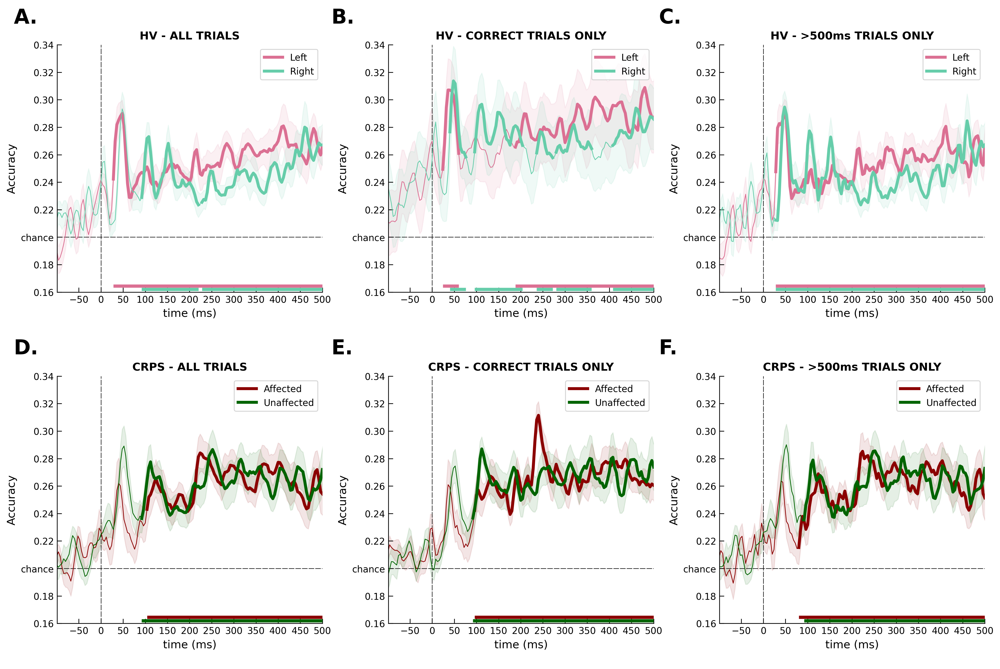

In [21]:
# Initialize figure with high resolution 
figCor, axs = plt.subplots(2, 3, figsize= (15,10), dpi = 300, constrained_layout = True)

# Set values ranges for all time axes 
plt.setp(axs, xlim = (-99, 500), ylim = (0.16,0.34))

# Draw the sub-figure letters
figCor.text(0.01, 0.970, "A.", fontsize = 22, fontweight = "bold") 
figCor.text(0.33, 0.970, "B.", fontsize = 22, fontweight = "bold")
figCor.text(0.66, 0.970, "C.", fontsize = 22, fontweight = "bold") 
figCor.text(0.01, 0.470, "D.", fontsize = 22, fontweight = "bold")
figCor.text(0.33, 0.470, "E.", fontsize = 22, fontweight = "bold")
figCor.text(0.66, 0.470, "F.", fontsize = 22, fontweight = "bold")

for i in range(2):
    for j in range(3):
        # draw dashed line for stimulus onset
        axs[i,j].axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # draw lines for chance level
        axs[i,j].axhline(y = 0.2, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
        # remove top and right axes
        axs[i,j].spines['right'].set_visible(False)
        axs[i,j].spines['top'].set_visible(False)
        # move ticks inside the graph and make them longer
        axs[i,j].tick_params(direction = 'in', length = 5, labelsize = 10)
        # adjust time ticks to every 50 ms and set label
        axs[i,j].set_xticks(np.arange(-50, 501, 50))
        axs[i,j].set_xlabel('time (ms)\n', fontsize = 12)
        # indicate the level of chance with a labelled tick
        tcks = np.arange(0.16, 0.36, 0.02)
        axs[i,j].set_yticks(tcks)
        ticklabs = ['0.16','0.18','chance','0.22','0.24','0.26','0.28','0.30','0.32', '0.34']
        axs[i,j].set_yticklabels(ticklabs)
        # set measure label
        axs[i,j].set_ylabel('Accuracy', fontsize = 12)
        # set position of rugs
        rug = axs[i,j].get_ylim()[0]+0.002


                                        # GROUP COMPARISON

  # HV
mvpaplot(axs[0,0], a_left, 'left_active', 'Left', c = 'palevioletred', low_rug = False)
mvpaplot(axs[0,0], a_right, 'right_active', 'Right', c = 'mediumaquamarine', title = '\nHV - ALL TRIALS')
axs[0,0].legend(loc = 'upper right')

  # CRPS
mvpaplot(axs[1,0], a_aff, 'affected_active', 'Affected', c = 'darkred', low_rug = False)
mvpaplot(axs[1,0], a_unaff, 'unaffected_active', 'Unaffected', c = 'darkgreen', title = '\nCRPS - ALL TRIALS')
axs[1,0].legend(loc = 'upper right')        
            
  #  HV
mvpaplot(axs[0,1], left_cor, 'left', 'Left', c = 'palevioletred', low_rug = False)
mvpaplot(axs[0,1], right_cor, 'right', 'Right', c = 'mediumaquamarine', title = '\n\nHV - CORRECT TRIALS ONLY')
axs[0,1].legend(loc = 'upper right')

  # CRPS
mvpaplot(axs[1,1], aff_cor, 'affected', 'Affected', c = 'darkred', low_rug = False) 
mvpaplot(axs[1,1], unaff_cor, 'unaffected', 'Unaffected', c = 'darkgreen', title = '\n\nCRPS - CORRECT TRIALS ONLY')
axs[1,1].legend(loc = 'upper right')

  #  HV
mvpaplot(axs[0,2], left_500, 'left500', 'Left', c = 'palevioletred', low_rug = False)
mvpaplot(axs[0,2], right_500, 'right500', 'Right', c = 'mediumaquamarine', title = '\n\nHV - >500ms TRIALS ONLY')
axs[0,2].legend(loc = 'upper right')

  # CRPS
mvpaplot(axs[1,2], aff_500, 'affected500', 'Affected', c = 'darkred', low_rug = False) 
mvpaplot(axs[1,2], unaff_500, 'unaffected500', 'Unaffected', c = 'darkgreen', title = '\n\nCRPS - >500ms TRIALS ONLY')
axs[1,2].legend(loc = 'upper right')


figCor.savefig('/Users/Serena/Desktop/CRPS_decoding_paper/FigCOR.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
        transparent = False, pad_inches=0.1, frameon=True)

<h4><center>SUPPLEMENTARY FIGURE 4 - TOPOMAPS</center></h4> 

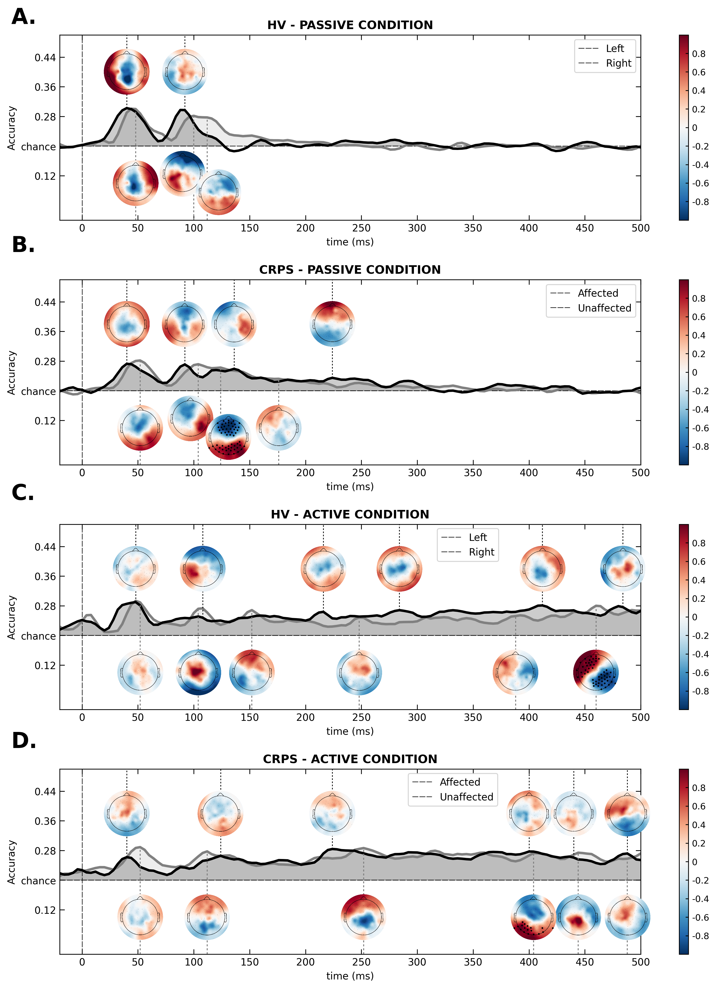

In [22]:
sfig3, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize= (10,14), dpi = 300, constrained_layout = True)
axs = [ax1, ax2, ax3, ax4]
plt.setp([ax for ax in axs], xlim = (-20, 500), ylim = (0.0, 0.50))

sfig3.text(0.01, 0.980, "A.", fontsize = 22, fontweight = "bold"); sfig3.text(0.01, 0.750, "B.", fontsize = 22, fontweight = "bold")
sfig3.text(0.01, 0.500, "C.", fontsize = 22, fontweight = "bold"); sfig3.text(0.01, 0.250, "D.", fontsize = 22, fontweight = "bold")

titles = ['\nHV - PASSIVE CONDITION', 'CRPS - PASSIVE CONDITION', 'HV - ACTIVE CONDITION', 'CRPS - ACTIVE CONDITION']

for i in range(4): 
    # draw dashed line for stimulus onset
    axs[i].axvline(x = 0, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # draw lines for chance level
    axs[i].axhline(y = 0.2, color = 'black', linestyle = '--', linewidth = 0.6, dashes = [10,2])
    # move ticks inside the graph and make them longer
    axs[i].tick_params(direction = 'in', length = 5, labelsize = 10)
    # adjust time ticks to every 50 ms and set label
    axs[i].set_xticks(np.arange(0, 501, 50))
    axs[i].set_xlabel('time (ms)\n', fontsize = 10)
    axs[i].tick_params(direction = 'in', length = 5, labelsize = 10, bottom = True, top = True, left = True, 
            right = True, labelbottom = True, labeltop = False, labelleft = True, labelright = False)
    # indicate the level of chance with a labelled tick
    tcks = np.arange(0.12, 0.52, 0.08)
    axs[i].set_yticks(tcks)
    ticklabs = ['0.12', 'chance','0.28','0.36', '0.44']
    axs[i].set_yticklabels(ticklabs)
    # set measure label
    axs[i].set_ylabel('Accuracy', fontsize = 10)
    axs[i].set_title(titles[i], fontweight="bold")
    # add colomaps
    bar = sfig3.colorbar(mapp(norm=None, cmap='RdBu_r'), ax=axs[i])
    bar.set_ticks([0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1])
    bar.set_ticklabels(['0.8', '0.6', '0.4', '0.2', '0', '-0.2', '-0.4', '-0.6', '-0.8'])
    bar.ax.tick_params(direction='in', length = 3, labelsize=9)

# ----------------------------------------------------------------------------------------------------------------- #
ax1.plot(time, p_right['m'], color = 'grey', lw = 2.5) # lighter tone or grey
ax1.plot(time, p_left['m'], color = 'black', lw = 2.5)

ax1.fill_between(time, p_right['m'], 0.2, alpha=0.2, color='darkgrey', interpolate=True, where = (p_right['m'] > 0.2))
ax1.fill_between(time, p_left['m'], 0.2, alpha=0.2, color='black', interpolate=True, where = (p_left['m'] > 0.2))

ax1.legend(["Left", "Right"])

for tp in [40, 48, 92, 100, 112]:
    if tp == 40 or tp == 92:
        ax1.axvline(x = tp, ymin = (p_left.loc[tp, 'm'])*2, color = 'black', linestyle = '-', linewidth = 0.8, dashes = [2,2])
    else:
        ax1.axvline(x = tp, ymax = (p_right.loc[tp, 'm'])*2, color = 'grey', linestyle = '-', linewidth = 1, dashes = [2,2])

topomap(ax1, 'pl40', 40, 0.4); topomap(ax1, 'pl92', 92, 0.4); 
topomap(ax1, 'pr48', 48, 0.1); 
topomap(ax1, 'pr100', 90, 0.125); topomap(ax1, 'pr112', 122, 0.075); 

# ------------------------------------------------------------------------------------------------------------------ #
ax2.plot(time, p_unaff['m'], color = 'grey', lw = 2.5) # lighter tone or grey
ax2.plot(time, p_aff['m'], color = 'black', lw = 2.5)

ax2.fill_between(time, p_unaff['m'], 0.2, alpha=0.2, color='darkgrey', interpolate=True, where = (p_unaff['m'] > 0.2))
ax2.fill_between(time, p_aff['m'], 0.2, alpha=0.2, color='black', interpolate=True, where = (p_aff['m'] > 0.2))

ax2.legend(["Affected", "Unaffected"])

for tp in [40, 52, 92, 104, 124, 136, 176, 224]:
    if tp == 40 or tp == 92 or tp == 136 or tp == 224:
        ax2.axvline(x = tp, ymin = (p_aff.loc[tp, 'm'])*2, color = 'black', linestyle = '-', linewidth = 0.8, dashes = [2,2])
    else:
        ax2.axvline(x = tp, ymax = (p_unaff.loc[tp, 'm'])*2, color = 'grey', linestyle = '-', linewidth = 1, dashes = [2,2])

topomap(ax2, 'pa40', 40); topomap(ax2, 'pa92', 92); topomap(ax2, 'pa136', 136); topomap(ax2, 'pa224', 224); 
topomap(ax2, 'pu52', 52, 0.1); topomap(ax2, 'pu104', 97, 0.125); topomap(ax2, 'pu124', 131, 0.075); 
topomap(ax2, 'pu176', 176, 0.1); 

# ------------------------------------------------------------------------------------------------------------------ #
ax3.plot(time, a_right['m'], color = 'grey', lw = 2.5) # lighter tone or grey
ax3.plot(time, a_left['m'], color = 'black', lw = 2.5)

ax3.fill_between(time, a_right['m'], 0.2, alpha=0.2, color='darkgrey', interpolate=True, where = (a_right['m'] > 0.2))
ax3.fill_between(time, a_left['m'], 0.2, alpha=0.2, color='black', interpolate=True, where = (a_left['m'] > 0.2))

ax3.legend(["Left", "Right"], loc = (0.65, 0.8))

for tp in [48, 52, 104, 108, 152, 216, 248, 284, 388, 412, 460, 484]:
    if tp == 48 or tp == 108 or tp == 216 or tp == 284 or tp == 412 or tp == 484:
        ax3.axvline(x = tp, ymin = (a_left.loc[tp, 'm'])*2, color = 'black', linestyle = '-', linewidth = 0.8, dashes = [2,2])
    else:
        ax3.axvline(x = tp, ymax = (a_right.loc[tp, 'm'])*2, color = 'grey', linestyle = '-', linewidth = 1, dashes = [2,2])

topomap(ax3, 'al48', 48); topomap(ax3, 'al108', 108); topomap(ax3, 'al216', 216); 
topomap(ax3, 'al284', 284); topomap(ax3, 'al412', 412); topomap(ax3, 'al484', 484); 

topomap(ax3, 'ar52', 52, 0.1); topomap(ax3, 'ar104', 104, 0.1); topomap(ax3, 'ar152', 152, 0.1);  
topomap(ax3, 'ar248', 248, 0.1); topomap(ax3, 'ar388', 388, 0.1); topomap(ax3, 'ar460', 460, 0.1); 

# ------------------------------------------------------------------------------------------------------------------ #
ax4.plot(time, a_unaff['m'], color = 'grey', lw = 2.5) # lighter tone or grey
ax4.plot(time, a_aff['m'], color = 'black', lw = 2.5)

ax4.fill_between(time, a_unaff['m'], 0.2, alpha=0.2, color='darkgrey', interpolate=True, where = (a_unaff['m'] > 0.2))
ax4.fill_between(time, a_aff['m'], 0.2, alpha=0.2, color='black', interpolate=True, where = (a_aff['m'] > 0.2))

ax4.legend(["Affected", "Unaffected"], loc = (0.60, 0.8))

for tp in [40, 52, 112, 124, 224, 252, 400, 404, 440, 444, 488]:
    if tp == 488:
        ax4.axvline(x = tp, ymin = (a_aff.loc[tp, 'm'])*2, color = 'black', linestyle = '-', linewidth = 0.8, dashes = [2,2])
        ax4.axvline(x = tp, ymax = (a_unaff.loc[tp, 'm'])*2, color = 'grey', linestyle = '-', linewidth = 1, dashes = [2,2])
    elif tp == 40 or tp == 124 or tp == 224 or tp == 400 or tp == 440:
        ax4.axvline(x = tp, ymin = (a_aff.loc[tp, 'm'])*2, color = 'black', linestyle = '-', linewidth = 0.8, dashes = [2,2])
    else:
        ax4.axvline(x = tp, ymax = (a_unaff.loc[tp, 'm'])*2, color = 'grey', linestyle = '-', linewidth = 1, dashes = [2,2])

topomap(ax4, 'aa40', 40); topomap(ax4, 'aa124', 124); topomap(ax4, 'aa224', 224); 
topomap(ax4, 'aa404', 400); topomap(ax4, 'aa444', 440); topomap(ax4, 'aa488', 488);  
topomap(ax4, 'au52', 52, 0.1); topomap(ax4, 'au112', 112, 0.1); 
topomap(ax4, 'au252', 252, 0.1);  topomap(ax4, 'au444', 444, 0.1);  
topomap(ax4, 'au404', 404, 0.1); topomap(ax4, 'au488', 488, 0.1);

# sfig3.savefig('../Final_figures/Supp3.tiff', dpi=300, format="tiff", facecolor='white', edgecolor='white',
#         transparent = False, pad_inches=0.1, frameon=True)